# Data Preparation

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

In [37]:
data = pd.read_csv('bank-additional 1.csv')
data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,varrate,conspriceidx,consconfidx,euribor3m,nremployed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [38]:
job_dummies = pd.get_dummies(data['job'], prefix="job")
data = pd.concat([data, job_dummies], axis=1, sort=False)
day_dummies = pd.get_dummies(data['day_of_week'], prefix="day")
data = pd.concat([data, day_dummies], axis=1, sort=False)
month_dummies = pd.get_dummies(data['month'], prefix="month")
data = pd.concat([data, month_dummies], axis=1, sort=False)
marry_dummies = pd.get_dummies(data['marital'], prefix="MS")
data = pd.concat([data, marry_dummies], axis=1, sort=False)
out_dummies = pd.get_dummies(data['poutcome'], prefix="O")
data = pd.concat([data, out_dummies], axis=1, sort=False)
data.transpose()

,0,1,2,3,4,5,6,7,8,9,...,41178,41179,41180,41181,41182,41183,41184,41185,41186,41187
age,56,57,37,40,56,45,59,41,24,25,...,62,64,36,37,29,73,46,56,44,74
job,housemaid,services,services,admin.,services,services,admin.,blue-collar,technician,services,...,retired,retired,admin.,admin.,unemployed,retired,blue-collar,retired,technician,retired
marital,married,married,married,married,married,married,married,married,single,single,...,married,divorced,married,married,single,married,married,married,married,married
education,basic.4y,high.school,high.school,basic.6y,high.school,basic.9y,professional.course,unknown,professional.course,high.school,...,university.degree,professional.course,university.degree,university.degree,basic.4y,professional.course,professional.course,university.degree,professional.course,professional.course
default,no,unknown,no,no,no,unknown,no,unknown,no,no,...,no,no,no,no,no,no,no,no,no,no
housing,no,no,yes,no,no,no,no,no,yes,yes,...,no,yes,no,yes,yes,yes,no,yes,no,yes
loan,no,no,no,no,yes,no,no,no,no,no,...,no,no,no,no,no,no,no,no,no,no
contact,telephone,telephone,telephone,telephone,telephone,telephone,telephone,telephone,telephone,telephone,...,cellular,cellular,cellular,cellular,cellular,cellular,cellular,cellular,cellular,cellular
month,may,may,may,may,may,may,may,may,may,may,...,nov,nov,nov,nov,nov,nov,nov,nov,nov,nov
day_of_week,mon,mon,mon,mon,mon,mon,mon,mon,mon,mon,...,thu,fri,fri,fri,fri,fri,fri,fri,fri,fri


In [39]:
data = data.drop('default',axis = 1)

## 缺失值处理

In [40]:
for i in data.columns:
    if type(data[i][0]) is str:
        print ("unknown value count in "+i+":\t"+str(data[data[i] == 'unknown']['y'].count()))

unknown value count in job:	330
unknown value count in marital:	80
unknown value count in education:	1731
unknown value count in housing:	990
unknown value count in loan:	990
unknown value count in contact:	0
unknown value count in month:	0
unknown value count in day_of_week:	0
unknown value count in poutcome:	0
unknown value count in y:	0


In [41]:
drop_null_attrs = ['job','marital', 'education', 'housing', 'loan']
for i in drop_null_attrs:
    data = data[data[i]!='unknown']

## binary处理

In [42]:
bin_attrs = ['housing','loan']
def encode_bin_attrs(data,bin_attrs):
    for i in bin_attrs:
        data[i] = data[i].map({'yes':1, 'no':0, 'unknown':'unknown'})
    return data

data['contact'] = data['contact'].map({'telephone':1, 'cellular':0})

## 有序分类变量处理

In [43]:
def encode_edu_attrs(data):
    order_dict = {"illiterate":1, "basic.4y":2, "basic.6y":2, "basic.9y":2, 
    "high.school":3,  "professional.course":3, "university.degree":4,"unknown":"unknown"}
    data['education'] = data['education'].map(order_dict) 
    return data

## 无序分类变量处理

In [44]:
data = encode_edu_attrs(data)
data = encode_bin_attrs(data, bin_attrs)
data['y'] = data['y'].map({'no': 0, 'yes': 1}).astype(int)
data.duration = data.duration/60

## 归一

In [45]:
numeric_attrs = ['age', 'campaign', 'pdays', 'previous',
                     'varrate', 'conspriceidx', 'consconfidx',
                     'euribor3m', 'nremployed']
def feature_scaling(data, numeric_attrs):
    for i in numeric_attrs:
        std = data[i].std()
        if std != 0:
            data[i] = (data[i]-data[i].mean()) / std
        else:
            data = data.drop(i, axis=1)
    return data

feature_scaling(data, numeric_attrs)

,age,job,marital,education,housing,loan,contact,month,day_of_week,duration,...,month_nov,month_oct,month_sep,MS_divorced,MS_married,MS_single,MS_unknown,O_failure,O_nonexistent,O_success
0,1.568507,housemaid,married,2,0,0,1,may,mon,4.350000,...,0,0,0,0,1,0,0,0,1,0
1,1.665693,services,married,3,0,0,1,may,mon,2.483333,...,0,0,0,0,1,0,0,0,1,0
2,-0.278038,services,married,3,1,0,1,may,mon,3.766667,...,0,0,0,0,1,0,0,0,1,0
3,0.013521,admin.,married,2,0,0,1,may,mon,2.516667,...,0,0,0,0,1,0,0,0,1,0
4,1.568507,services,married,3,0,1,1,may,mon,5.116667,...,0,0,0,0,1,0,0,0,1,0
5,0.499454,services,married,2,0,0,1,may,mon,3.300000,...,0,0,0,0,1,0,0,0,1,0
6,1.860066,admin.,married,3,0,0,1,may,mon,2.316667,...,0,0,0,0,1,0,0,0,1,0
8,-1.541464,technician,single,3,1,0,1,may,mon,6.333333,...,0,0,0,0,0,1,0,0,1,0
9,-1.444277,services,single,3,1,0,1,may,mon,0.833333,...,0,0,0,0,0,1,0,0,1,0
11,-1.444277,services,single,3,1,0,1,may,mon,3.700000,...,0,0,0,0,0,1,0,0,1,0


# Logistic Regression

In [46]:
import statsmodels.formula.api as smf
results = smf.logit("y ~ age+duration+euribor3m+conspriceidx+consconfidx+varrate+nremployed+ C(education, Treatment(reference=1))+housing+loan+contact+campaign+pdays+previous+C(poutcome, Treatment(reference='nonexistent'))+C(month, Treatment(reference='may'))+C(job, Treatment(reference='unemployed'))+C(day_of_week, Treatment(reference='mon'))+C(marital, Treatment(reference='single'))",data=data).fit()
print(results.summary())

Optimization terminated successfully.
         Current function value: 0.206670
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                38245
Model:                          Logit   Df Residuals:                    38201
Method:                           MLE   Df Model:                           43
Date:                Mon, 04 May 2020   Pseudo R-squ.:                  0.4083
Time:                        15:36:42   Log-Likelihood:                -7904.1
converged:                       True   LL-Null:                       -13359.
                                        LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
Intercept   

In [47]:
import statsmodels.formula.api as smf
results = smf.logit("y ~ age+duration+euribor3m+conspriceidx+consconfidx+varrate+nremployed+ C(education, Treatment(reference=1))+housing+loan+contact+campaign+pdays+previous+C(poutcome, Treatment(reference='nonexistent'))+C(month, Treatment(reference='may'))+C(day_of_week, Treatment(reference='mon'))+C(marital, Treatment(reference='single'))",data=data[data['job'].isin(['student'])]).fit()
print(results.summary())

Optimization terminated successfully.
         Current function value: 0.393049
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  688
Model:                          Logit   Df Residuals:                      655
Method:                           MLE   Df Model:                           32
Date:                Mon, 04 May 2020   Pseudo R-squ.:                  0.3586
Time:                        15:36:43   Log-Likelihood:                -270.42
converged:                       True   LL-Null:                       -421.62
                                        LLR p-value:                 9.013e-46
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
Intercept   

In [48]:
import statsmodels.formula.api as smf
results = smf.logit("y ~ age+duration+euribor3m+conspriceidx+consconfidx+varrate+nremployed+ C(education, Treatment(reference=1))+housing+loan+contact+campaign+pdays+previous+C(poutcome, Treatment(reference='nonexistent'))+C(month, Treatment(reference='may'))+C(day_of_week, Treatment(reference='mon'))+C(marital, Treatment(reference='single'))",data=data[data['job'].isin(['retired'])]).fit()
print(results.summary())

Optimization terminated successfully.
         Current function value: 0.352439
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1577
Model:                          Logit   Df Residuals:                     1543
Method:                           MLE   Df Model:                           33
Date:                Mon, 04 May 2020   Pseudo R-squ.:                  0.3699
Time:                        15:36:44   Log-Likelihood:                -555.80
converged:                       True   LL-Null:                       -882.10
                                        LLR p-value:                3.581e-116
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
Intercept   

In [49]:
import statsmodels.formula.api as smf
results = smf.logit("y ~ age+duration+euribor3m+conspriceidx+consconfidx+varrate+nremployed+ C(education, Treatment(reference=1))+C(job, Treatment(reference='unemployed'))+housing+loan+contact+campaign+pdays+previous+C(poutcome, Treatment(reference='nonexistent'))+C(day_of_week, Treatment(reference='mon'))+C(marital, Treatment(reference='single'))",data=data[data['month'].isin(['mar'])]).fit()
print(results.summary())

         Current function value: 0.559971
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  497
Model:                          Logit   Df Residuals:                      466
Method:                           MLE   Df Model:                           30
Date:                Mon, 04 May 2020   Pseudo R-squ.:                  0.1920
Time:                        15:36:44   Log-Likelihood:                -278.31
converged:                      False   LL-Null:                       -344.44
                                        LLR p-value:                 8.381e-15
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
Intercept                                       

/Users/wuhongjun/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [50]:
import statsmodels.formula.api as smf
results = smf.logit("y ~ age+duration+euribor3m+conspriceidx+consconfidx+varrate+nremployed+ C(education, Treatment(reference=1))+C(job, Treatment(reference='unemployed'))+housing+loan+contact+campaign+pdays+previous+C(poutcome, Treatment(reference='nonexistent'))+C(day_of_week, Treatment(reference='mon'))+C(marital, Treatment(reference='single'))",data=data[data['month'].isin(['aug'])]).fit()
print(results.summary())

         Current function value: 0.186512
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 5822
Model:                          Logit   Df Residuals:                     5789
Method:                           MLE   Df Model:                           32
Date:                Mon, 04 May 2020   Pseudo R-squ.:                  0.4353
Time:                        15:36:46   Log-Likelihood:                -1085.9
converged:                      False   LL-Null:                       -1922.8
                                        LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
Intercept                                       

/Users/wuhongjun/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/wuhongjun/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1092: RuntimeWarning: invalid value encountered in sqrt
  bse_ = np.sqrt(np.diag(self.cov_params()))
/Users/wuhongjun/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/Users/wuhongjun/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/Users/wuhongjun/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


In [51]:
import statsmodels.formula.api as smf
results = smf.logit("y ~ age+duration+euribor3m+conspriceidx+consconfidx+varrate+nremployed+ C(education, Treatment(reference=1))+housing+loan+contact+campaign+pdays+previous+C(poutcome, Treatment(reference='nonexistent'))+C(month, Treatment(reference='may'))+C(job, Treatment(reference='unemployed'))+C(marital, Treatment(reference='single'))",data=data[data['day_of_week'].isin(['wed'])]).fit()
print(results.summary())

Optimization terminated successfully.
         Current function value: 0.200579
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 7602
Model:                          Logit   Df Residuals:                     7562
Method:                           MLE   Df Model:                           39
Date:                Mon, 04 May 2020   Pseudo R-squ.:                  0.4382
Time:                        15:36:47   Log-Likelihood:                -1524.8
converged:                       True   LL-Null:                       -2714.3
                                        LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
Intercept   

In [52]:
import statsmodels.formula.api as smf
results = smf.logit("y ~ age+duration+euribor3m+conspriceidx+consconfidx+varrate+nremployed+ C(education, Treatment(reference=1))+housing+loan+contact+campaign+pdays+previous+C(poutcome, Treatment(reference='nonexistent'))+C(month, Treatment(reference='may'))+C(job, Treatment(reference='unemployed'))+C(marital, Treatment(reference='single'))",data=data[data['day_of_week'].isin(['tue'])]).fit()
print(results.summary())

Optimization terminated successfully.
         Current function value: 0.196525
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 7481
Model:                          Logit   Df Residuals:                     7441
Method:                           MLE   Df Model:                           39
Date:                Mon, 04 May 2020   Pseudo R-squ.:                  0.4508
Time:                        15:36:48   Log-Likelihood:                -1470.2
converged:                       True   LL-Null:                       -2677.1
                                        LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
Intercept   

# Model Training/Estimation

In [53]:
data = data.drop('duration',axis = 1)
train = data.sample(frac = 0.8, random_state = 123) # training sample dataframe
test = data.drop(train.index).sample(frac = 0.5, random_state = 123) # test sample dataframe
validate = data.drop(train.index).drop(test.index) # validation sample dataframe

In [54]:
print(train['y'].value_counts())
print(validate['y'].value_counts())
print(test['y'].value_counts())

0    27175
1     3421
Name: y, dtype: int64
0    3414
1     411
Name: y, dtype: int64
0    3398
1     426
Name: y, dtype: int64


In [55]:
print(data.columns)

Index(['age', 'job', 'marital', 'education', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'poutcome',
       'varrate', 'conspriceidx', 'consconfidx', 'euribor3m', 'nremployed',
       'y', 'job_admin.', 'job_blue-collar', 'job_entrepreneur',
       'job_housemaid', 'job_management', 'job_retired', 'job_self-employed',
       'job_services', 'job_student', 'job_technician', 'job_unemployed',
       'job_unknown', 'day_fri', 'day_mon', 'day_thu', 'day_tue', 'day_wed',
       'month_apr', 'month_aug', 'month_dec', 'month_jul', 'month_jun',
       'month_mar', 'month_may', 'month_nov', 'month_oct', 'month_sep',
       'MS_divorced', 'MS_married', 'MS_single', 'MS_unknown', 'O_failure',
       'O_nonexistent', 'O_success'],
      dtype='object')


In [56]:
var_name = ['age', 'education', 'housing', 'loan', 'contact',
        'campaign', 'pdays', 'previous', 
       'varrate', 'conspriceidx', 'consconfidx', 'euribor3m', 'nremployed',
        'job_admin.', 'job_blue-collar', 'job_entrepreneur',
       'job_housemaid', 'job_management', 'job_retired', 'job_self-employed',
       'job_services', 'job_student', 'job_technician', 
        'day_fri',  'day_thu', 'day_tue', 'day_wed',
       'month_apr', 'month_aug', 'month_dec', 'month_jul', 'month_jun',
       'month_mar', 'month_nov', 'month_oct', 'month_sep',
       'MS_divorced', 'MS_married',  'O_failure',
        'O_success'
       ]

train.groupby("y")[var_name].mean().transpose()

y,0,1
age,-0.010476,0.094657
contact,0.384471,0.168372
campaign,0.021460,-0.188597
pdays,0.115331,-0.913346
previous,-0.076140,0.618262
varrate,0.100773,-0.833019
conspriceidx,0.045168,-0.383272
consconfidx,-0.018781,0.143236
euribor3m,0.103529,-0.855346
nremployed,0.119787,-0.984055


In [57]:
train[var_name]

,age,education,housing,loan,contact,campaign,pdays,previous,varrate,conspriceidx,...,month_jul,month_jun,month_mar,month_nov,month_oct,month_sep,MS_divorced,MS_married,O_failure,O_success
4243,0.596641,2,1,1,1,-0.204758,0.192454,-0.348973,0.649537,0.735099,...,0,0,0,0,0,0,0,1,0,0
5233,0.693827,2,1,0,1,0.156582,0.192454,-0.348973,0.649537,0.735099,...,0,0,0,0,0,0,1,0,0,0
4643,-0.180852,2,1,1,1,-0.566098,0.192454,-0.348973,0.649537,0.735099,...,0,0,0,0,0,0,0,1,0,0
34881,1.082574,2,1,0,0,-0.566098,0.192454,-0.348973,-1.202380,-1.175143,...,0,0,0,0,0,0,0,1,0,0
14865,-1.833023,3,1,0,0,-0.566098,0.192454,-0.348973,0.841115,0.603239,...,1,0,0,0,0,0,0,0,0,0
29909,-0.472411,4,1,0,0,0.517923,0.192454,-0.348973,-1.202380,-0.859372,...,0,0,0,0,0,0,0,1,0,0
1360,-1.249904,2,1,0,1,-0.566098,0.192454,-0.348973,0.649537,0.735099,...,0,0,0,0,0,0,0,1,0,0
23125,0.985387,2,1,0,0,-0.566098,0.192454,-0.348973,0.841115,-0.219154,...,0,0,0,0,0,0,0,1,0,0
23240,0.596641,2,0,0,0,0.517923,0.192454,-0.348973,0.841115,-0.219154,...,0,0,0,0,0,0,0,1,0,0
6779,-1.444277,2,1,0,1,-0.566098,0.192454,-0.348973,0.649537,0.735099,...,0,0,0,0,0,0,0,1,0,0


In [58]:
import statsmodels.api as sm

train['y'] = train['y'].astype(float)
train[var_name]=train[var_name].astype(float)
logit_model = sm.Logit(train["y"], train[var_name])
result = logit_model.fit()


Optimization terminated successfully.
         Current function value: 0.278792
         Iterations 7


In [59]:
from sklearn.linear_model import LogisticRegression

lr_model = LogisticRegression()
lr = lr_model.fit(train[var_name], train["y"])

/Users/wuhongjun/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


### CART: classification and regression tree

In [76]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz

np.random.seed(0)
clf_model_1 = DecisionTreeClassifier(random_state=100, max_depth=50, criterion="entropy")
clf_1 = clf_model_1.fit(train[var_name], train["y"])

In [77]:
from six import StringIO
from IPython.display import Image
import pydotplus
import os

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.194689 to fit



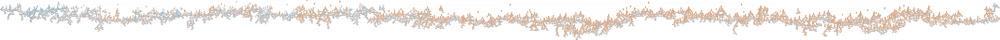

In [78]:
feature_cols = var_name
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin'
dot_data = StringIO()
export_graphviz(clf_1, 
                out_file=dot_data,  
                filled=True, 
                rounded=True,
                special_characters=True,
                feature_names = feature_cols,
                class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())
# graph.write_png("cart4.png") # this is to save into file

In [79]:
clf_model_2 = DecisionTreeClassifier(random_state=42, 
                                     max_depth=100,  # the max depth is 15 for the tree
                                     min_samples_leaf=5, # the min of observation is 5 for a leaf
                                     criterion="entropy" # slip the variable based on max entropy criterion
                                    )
clf_2 = clf_model_2.fit(train[var_name], train["y"])
dot_data = StringIO()
export_graphviz(clf_2, out_file=dot_data,  
                filled=True, 
                rounded=True,
                special_characters=True,
                feature_names = feature_cols,
                class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())
# graph.write_png("cart15.png") # this is to save into file

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.328877 to fit



### Get predicted probability and values

In [80]:
# predict_proba refers to probabilty
lr.predict_proba(validate[var_name]);
clf_1.predict_proba(validate[var_name]);
clf_2.predict_proba(validate[var_name]);

In [81]:
# predict refers to the prediction of class based on the rule the prob>0.5
lr.predict(validate[var_name]);
clf_1.predict(validate[var_name]);
clf_2.predict(validate[var_name]);

In [82]:
clf_1_importance = clf_1.tree_.compute_feature_importances(normalize=False)
clf_2_importance = clf_2.tree_.compute_feature_importances(normalize=False)
lr_importance = result.tvalues[:]

### Examing feature / variable importance in prediction

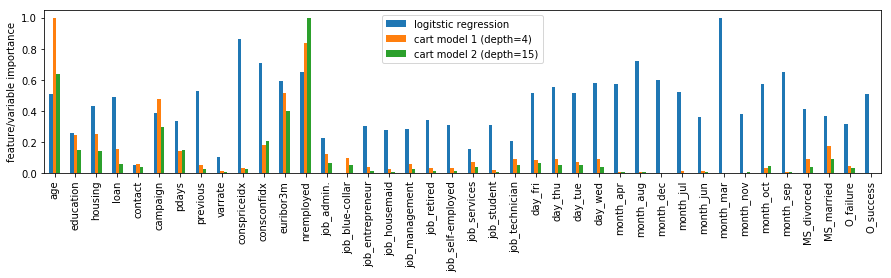

In [83]:
df_var_importance = pd.DataFrame({"logitstic regression": lr_importance,
                                   "cart model 1 (depth=4)": clf_1_importance, 
                                  "cart model 2 (depth=15)": clf_2_importance})
# normalzie to between 0-1
normalized_df = (df_var_importance - df_var_importance.min()) / (df_var_importance.max() - df_var_importance.min())
normalized_df.plot.bar(figsize=(15, 3))
plt.ylabel("feature/variable importance");

## Model Evaluation 

### Hit Ratio

In [84]:
validate["pred_logitstic"] = lr.predict(validate[var_name]);
validate["pred_cart4"] = clf_1.predict(validate[var_name]);
validate["pred_cart15"] = clf_2.predict(validate[var_name]);
validate["true"] = validate["y"]

In [85]:
hr_lr = sum(validate["pred_logitstic"] == validate["true"]) / len(validate["true"])
hr_cart4 = sum(validate["pred_cart4"] == validate["true"]) / len(validate["true"])
hr_cart15 = sum(validate["pred_cart15"] == validate["true"]) / len(validate["true"])
print("Logistic Regression:", hr_lr, "CART4", hr_cart4, "CART15", hr_cart15)

Logistic Regression: 0.9069281045751634 CART4 0.8433986928104575 CART15 0.8894117647058823


In [86]:
train["pred_logitstic"] = lr.predict(train[var_name]);
train["pred_cart4"] = clf_1.predict(train[var_name]);
train["pred_cart15"] = clf_2.predict(train[var_name]);
train["true"] = train["y"]
hr_lr = sum(train["pred_logitstic"] == train["true"]) / len(train["true"])
hr_cart4 = sum(train["pred_cart4"] == train["true"]) / len(train["true"])
hr_cart15 = sum(train["pred_cart15"] == train["true"]) / len(train["true"])
print("Logistic Regression:", hr_lr, "CART4", hr_cart4, "CART15", hr_cart15)

Logistic Regression: 0.9013269708458622 CART4 0.9939861419793437 CART15 0.9286508040266701


### ROC Curve

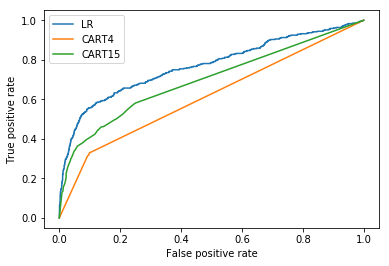

In [87]:
import numpy as np
from sklearn import metrics

fpr_lr, tpr_lr, thresholds_lr = metrics.roc_curve(validate["y"], lr.predict_proba(validate[var_name])[:, 1])
fpr_clf4, tpr_clf4, thresholds_clf4 = metrics.roc_curve(validate["y"], clf_1.predict_proba(validate[var_name])[:, 1])
fpr_clf15, tpr_clf15, thresholds_clf15 = metrics.roc_curve(validate["y"], clf_2.predict_proba(validate[var_name])[:, 1])

# metrics.plot_roc_curve(lr, validate[var_name], validate["Q18"])

plt.figure()
plt.plot(fpr_lr, tpr_lr)
plt.plot(fpr_clf4, tpr_clf4)
plt.plot(fpr_clf15, tpr_clf15)
plt.legend(["LR", "CART4", "CART15"])
plt.xlabel("False positive rate")
plt.ylabel("True positive rate");

### Confusion Matrix

In [560]:
from sklearn.metrics import confusion_matrix

confusion_matrix(validate["y"], lr.predict(validate[var_name])) # y_true, y_pred

array([[3370,   44],
       [ 312,   99]])